In [1]:
import numpy as np
import plotly.express as px
import pandas as pd

import sys
import os
sys.path.append(os.path.dirname(os.path.dirname(os.getcwd())))

from sandwich_numerical.sandwich import Sandwich

## Assemble 2 meshes. $\mu = 1$ in one mesh and $\mu = 1000$ in another one

In [2]:
block_height = 21
mesh_height = block_height * 3
block_size = (block_height, 3000)
grid_step = 0.005
mu_1 = 1
mu_2 = 1000

base_grad_vec = np.sin((2 * np.pi) / (mesh_height-1) * np.arange(mesh_height))

grad_vec_1 = np.copy(base_grad_vec)
mesh_1 = Sandwich(
    block_size,
    grad_vec_1,
    grid_step,
    mu_1
)

grad_vec_1000 = np.copy(base_grad_vec)
# grad_vec_1000[block_size[0]:2*block_size[0]] *= mu_2
mesh_1000 = Sandwich(
    block_size,
    grad_vec_1000,
    grid_step,
    mu_2
)

Run 10_000 iterations on each mesh

In [3]:
def process_mesh(mesh, iter_count):
    residuals = []
    for i in range(iter_count):
        mesh.step()
        if i % 100_000 == 0:
            print(i)
            residuals.append((i, mesh.get_residual()))
            
    return residuals

In [4]:
iter_count = 10_000

residuals_1 = process_mesh(mesh_1, iter_count)
residuals_1000 = process_mesh(mesh_1000, iter_count)

0
0


Analyze the distributions of displacements

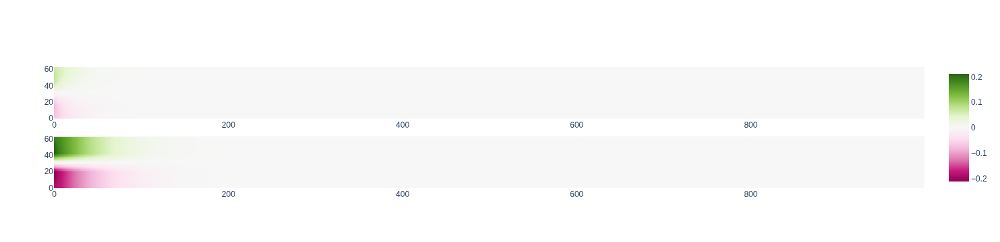

In [5]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots

fig = make_subplots(rows=2, cols=1)
fig.add_trace(px.imshow(mesh_1.get_displacement_array()[:, :1000]).data[0], row=1, col=1)
fig.add_trace(px.imshow(mesh_1000.get_displacement_array()[:, :1000]).data[0], row=2, col=1)

fig.update_layout()
fig.show()

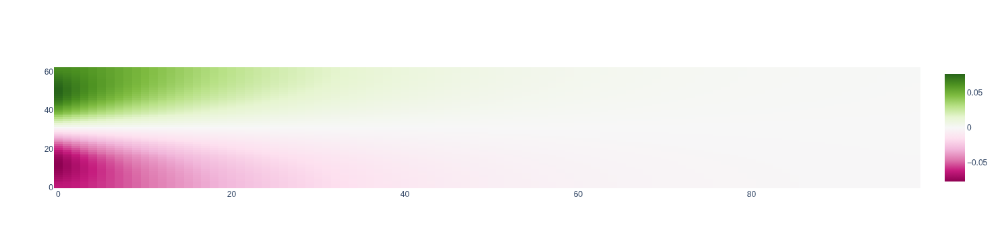

In [6]:
fig = make_subplots(rows=1, cols=1)
fig.add_trace(px.imshow(mesh_1.get_displacement_array()[:, :100]).data[0], row=1, col=1)

fig.update_layout()
fig.show()

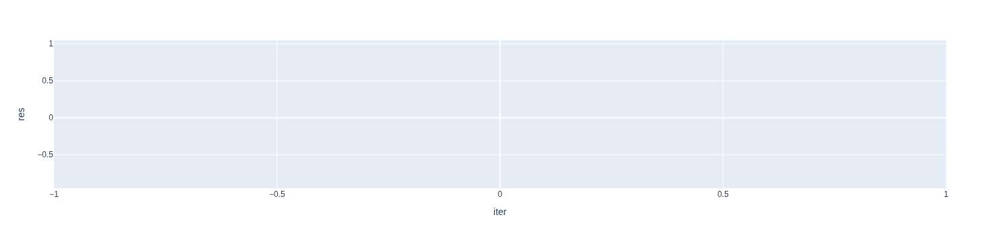

In [7]:
px.line(pd.DataFrame(residuals_1000, columns=['iter', 'res']), x='iter', y='res')

# Let's look at the cros section displacement distribution

In [8]:
def get_samples_df(mesh):
    displacement_data = mesh.get_displacement_array()
    
    sample_size = displacement_data.shape[0]
    return pd.DataFrame({
        'x2': np.arange(mesh_height) * grid_step,
        'x1=0.0': displacement_data[:, 0],
        'x1=0.2': displacement_data[:, 40],
        'x1=0.4': displacement_data[:, 80],
        'x1=1.0': displacement_data[:, 200]
    })

def plot_samples_data(mesh):
    df = get_samples_df(mesh)
    return px.line(df, x='x2', y=['x1=0.0', 'x1=0.2', 'x1=0.4', 'x1=1.0'])

### $\mu=1$

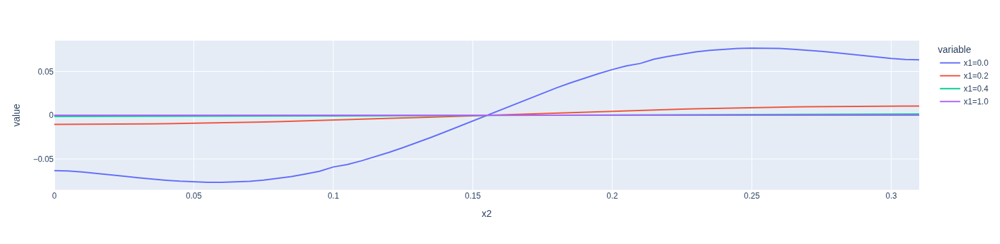

In [9]:
plot_samples_data(mesh_1)

### $\mu=1000$

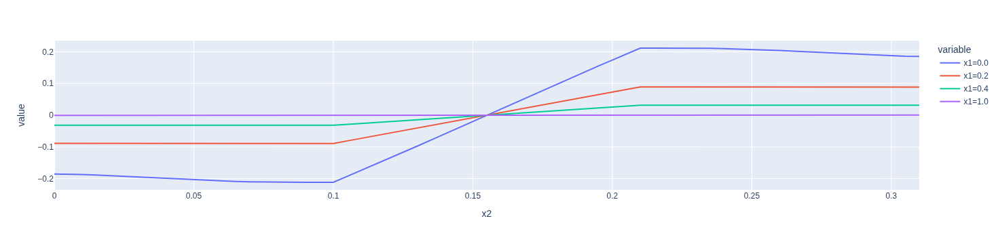

In [10]:
plot_samples_data(mesh_1000)

In [11]:
def displacement_data_to_df(mesh):
    displacement_data = mesh.get_displacement_array()
    result_dict = {
        'x2_mesh_id': np.arange(mesh_height),
        'x2_bottom': np.arange(mesh_height) * grid_step,
        'x2_top': np.arange(mesh_height)
    }
    result_dict['x2_bottom'] = result_dict['x2_mesh_id'] * grid_step
    result_dict['x2_top'] = result_dict['x2_bottom'] + grid_step
    
    for i in range(displacement_data.shape[1]):
        result_dict['x1=%.4f' % (i * grid_step)] = displacement_data[:, i]
        
    return pd.DataFrame(result_dict)

In [12]:
displacement_data_to_df(mesh_1).to_csv('/tmp/displacement_mu_1.csv', index=False)
displacement_data_to_df(mesh_1000).to_csv('/tmp/displacement_mu_1000.csv', index=False)

In [13]:
displacement_data_to_df(mesh_1)

,x2_mesh_id,x2_bottom,x2_top,x1=0.0000,x1=0.0050,x1=0.0100,x1=0.0150,x1=0.0200,x1=0.0250,x1=0.0300,...,x1=14.9500,x1=14.9550,x1=14.9600,x1=14.9650,x1=14.9700,x1=14.9750,x1=14.9800,x1=14.9850,x1=14.9900,x1=14.9950
0,0,0.000,0.005,-0.063206,-0.063206,-0.062081,-0.060576,-0.058831,-0.056931,-0.054937,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1,0.005,0.010,-0.063712,-0.063206,-0.062081,-0.060576,-0.058831,-0.056931,-0.054937,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2,0.010,0.015,-0.064833,-0.063826,-0.062459,-0.060818,-0.058985,-0.057025,-0.054988,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,3,0.015,0.020,-0.066303,-0.064806,-0.063113,-0.061252,-0.059266,-0.057197,-0.055080,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,4,0.020,0.025,-0.067955,-0.065984,-0.063934,-0.061810,-0.059630,-0.057416,-0.055191,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58,58,0.290,0.295,0.067955,0.065984,0.063934,0.061810,0.059630,0.057416,0.055191,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
59,59,0.295,0.300,0.066303,0.064806,0.063113,0.061252,0.059266,0.057197,0.055080,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
60,60,0.300,0.305,0.064833,0.063826,0.062459,0.060818,0.058985,0.057025,0.054988,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
61,61,0.305,0.310,0.063712,0.063206,0.062081,0.060576,0.058831,0.056931,0.054937,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
